In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys

%store -r SHiP_ROOT_FOLDER
if "SHiP_ROOT_FOLDER" in globals():
    os.chdir(SHiP_ROOT_FOLDER)
    sys.path.append(SHiP_ROOT_FOLDER)

In [2]:
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

In [3]:
colors = [
    "blue",
    "red",
    "green",
    "yellow",
    "orange",
    "purple",
    "indianred",
    "pink",
    "cyan",
    "magenta",
    "lime",
    "teal",
    "darkred",
    "navy",
    "olive",
    "gold",
    # "silver",
    "coral",
    "mediumorchid",
    "violet",
    "khaki",
    "lightcoral",
    "aquamarine",
    "darkkhaki",
    "steelblue",
    "turquoise",
]

def own_cmap(labels):
    return [colors[int(label) % len(colors)] for label in labels]

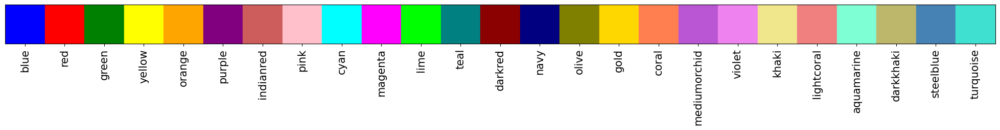

In [4]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

font = {'family': 'sans-serif',
        'size': 15}
plt.rc('font', **font)

# Points along the 1D line
x = list(range(len(colors)))

# Colors for the boxes
box_colors = own_cmap(x)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(len(colors), 1))

# Add colored boxes along the line
box_height = 1  # Height of the boxes
for i, color in enumerate(box_colors):
    rect = Rectangle((x[i], -box_height / 2), 1, box_height, color=color)  # Box width = 0.8
    ax.add_patch(rect)

# Adjust the axis limits and remove unnecessary details
ax.set_xlim(min(x), max(x) + 1)
ax.set_ylim(-0.5, 0.5)
ax.set_yticks([])
ax.set_xticks([i + 0.5 for i in x])
ax.set_xticklabels(box_colors, rotation=90)
# ax.axis('off')  # Turn off axis for a cleaner look

# Show the plot
plt.show()

In [5]:
from sklearn.decomposition import PCA

def plot_clustering(ax, points, labels, dot_scale=1):
    dot_size = (plt.rcParams['lines.markersize'] ** 2) * dot_scale

    points = np.array(points)
    labels = np.array(labels)

    if points.shape[1] > 2:
        pca = PCA(n_components=2)
        points = pca.fit_transform(points)

    # Plot non noise points
    real_points = points[labels != -1]
    real_labels = labels[labels != -1]
    real_color_labels = own_cmap(real_labels)
    real_edgecolors = ["black"]  * len(real_points)
    ax.scatter(real_points[:, 0], real_points[:, 1], c=real_color_labels, s=dot_size, edgecolor=real_edgecolors, zorder=1, linewidths=0.3)

    #Plot noise points on top
    noise_points = points[labels == -1]
    noise_labels = ["darkgrey"] * len(noise_points)
    noise_edgecolors = ["black"] * len(noise_points)
    ax.scatter(points[labels == -1][:, 0], noise_points[:, 1], c=noise_labels, s=dot_size, edgecolor=noise_edgecolors, alpha=0.4, zorder=0)


In [6]:
from sklearn.metrics import confusion_matrix
from scipy.optimize import linear_sum_assignment

def reorder_labels(y_pred, y_true):
    cm = confusion_matrix(y_true, y_pred)
    _, col_ind = linear_sum_assignment(
        -cm
    )  # col_ind returns how to reorder the columns (colors of y_pred)
    y_pred_permuted = np.argsort(col_ind)[
        y_pred
    ]  # we need the inverse mapping which we get through argsort
    return y_pred_permuted

In [7]:
from SHiP import SHiP

ship_cache = {}

def load_labeling(dataset, tree_type, power, method):
    X, ground_truth_labels = dataset.data_cached

    path = "./results/labels/*/"
    file_paths = (glob.glob(path + f"{dataset.name}##{tree_type}_{method}##0.npy"))
    if True or len(file_paths) == 0:
        key = (dataset, tree_type)
        if key in ship_cache:
            ship = ship_cache[key]
        else:
            ship = SHiP(data=X, treeType=tree_type, config={"relaxed": True})

        ship.power=power
        ship.partitioningMethod=method
        ship.k = len(set(ground_truth_labels))
        clustering_labels = ship.fit_predict()
        clustering_labels = np.array(clustering_labels)
        # raise "Clustering not found"
    else:
        file_path = file_paths[0]
        clustering_labels = np.load(file_path)
    clustering_labels[clustering_labels != -1] = reorder_labels(clustering_labels[clustering_labels != -1], ground_truth_labels[clustering_labels != -1])

    return X, clustering_labels

In [8]:
from datasets.example_datasets import Datasets as ExampleDatasets

X, ground_truth_labels = ExampleDatasets.d31.data_cached

ship = SHiP(data=X, treeType="DCTree", power=2, partitioningMethod="K")
ship.k = len(set(ground_truth_labels))
clustering_labels = ship.fit_predict()
len(set(clustering_labels))

31

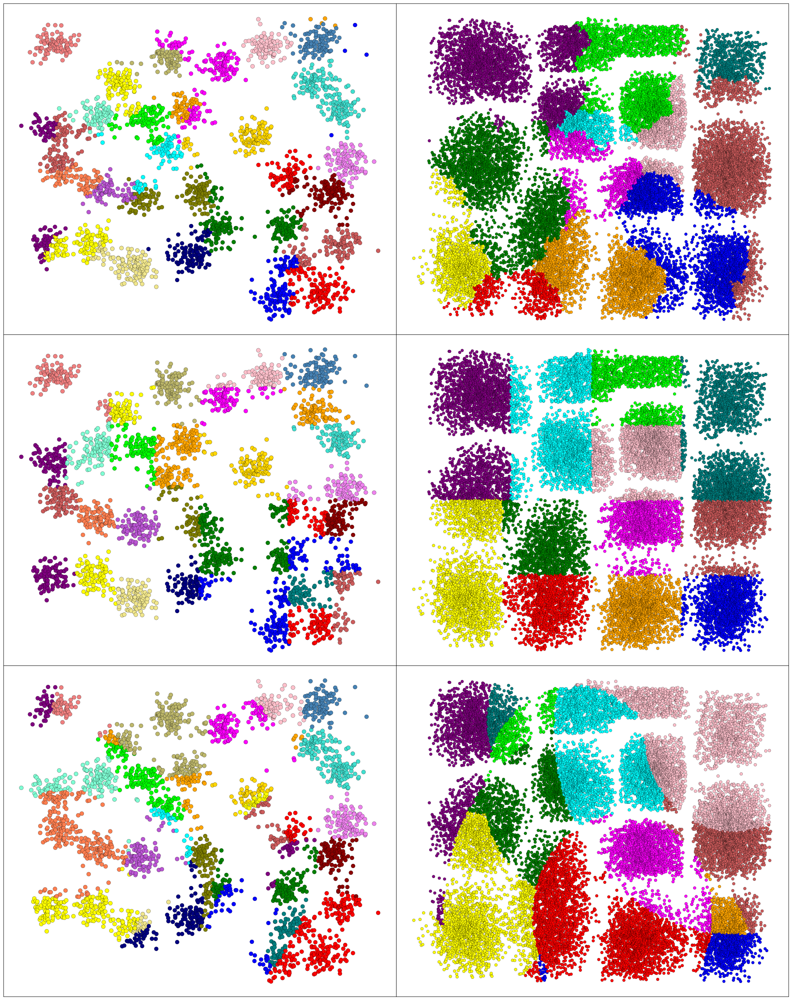

In [9]:
from datasets.example_datasets import Datasets as ExampleDatasets

figure_settings = [
    [
        {
            "dataset": ExampleDatasets.d31,
            "tree_type": "CoverTree",
            "power": 2,
            "method": "K",
        },
        {
            "dataset": ExampleDatasets.boxes3,
            "tree_type": "CoverTree",
            "power": 2,
            "method": "K",
        },
    ], [
        {
            "dataset": ExampleDatasets.d31,
            "tree_type": "KDTree",
            "power": 2,
            "method": "K",
        },
        {
            "dataset": ExampleDatasets.boxes3,
            "tree_type": "KDTree",
            "power": 2,
            "method": "K",
        },
    ], [
        {
            "dataset": ExampleDatasets.d31,
            "tree_type": "HST",
            "power": 2,
            "method": "K",
        },
        {
            "dataset": ExampleDatasets.boxes3,
            "tree_type": "HST",
            "power": 2,
            "method": "K",
        },
    ],
]



fontsize = 45
font = {'family': 'sans-serif',
        'size': fontsize}
plt.rc('font', **font)

fig, axes = plt.subplots(len(figure_settings), len(figure_settings[0]), figsize=(24,30))

for i, row_settings in enumerate(figure_settings):
    for j, setting in enumerate(row_settings):
        X, l = load_labeling(**setting)
        axes[i,j].set_xticks([])
        axes[i,j].set_yticks([])
        plot_clustering(axes[i,j], X, l, dot_scale=2 if j == 0 else 1)

# axes[0,0].set_title("d31", fontsize=fontsize)
# axes[0,1].set_title("boxes", fontsize=fontsize)

# axes[0,0].set_ylabel("CoverTree", fontsize=fontsize)
# axes[1,0].set_ylabel("KDTree", fontsize=fontsize)
# axes[2,0].set_ylabel("HST", fontsize=fontsize)


#orig: wspace=0.0, hspace=0.05
#kdtree: wspace=-0, hspace=-0.509
#dctree: wspace=-0.74, hspace=0

plt.tight_layout()
plt.subplots_adjust(wspace=0.0, hspace=0.0) #CHANGE SPACING HERE BETWEEN THE CLUSTER PLOTS
plt.savefig("DCFramework_Ultrametrics.jpg", bbox_inches='tight', pad_inches=0.05, dpi=70)
plt.show()

In [10]:
X, l = load_labeling(**{
            "dataset": ExampleDatasets.d31,
            "tree_type": "DCTree",
            "power": 0,
            "method": "stability",
        })

from collections import Counter

len(l[l == -1])

525

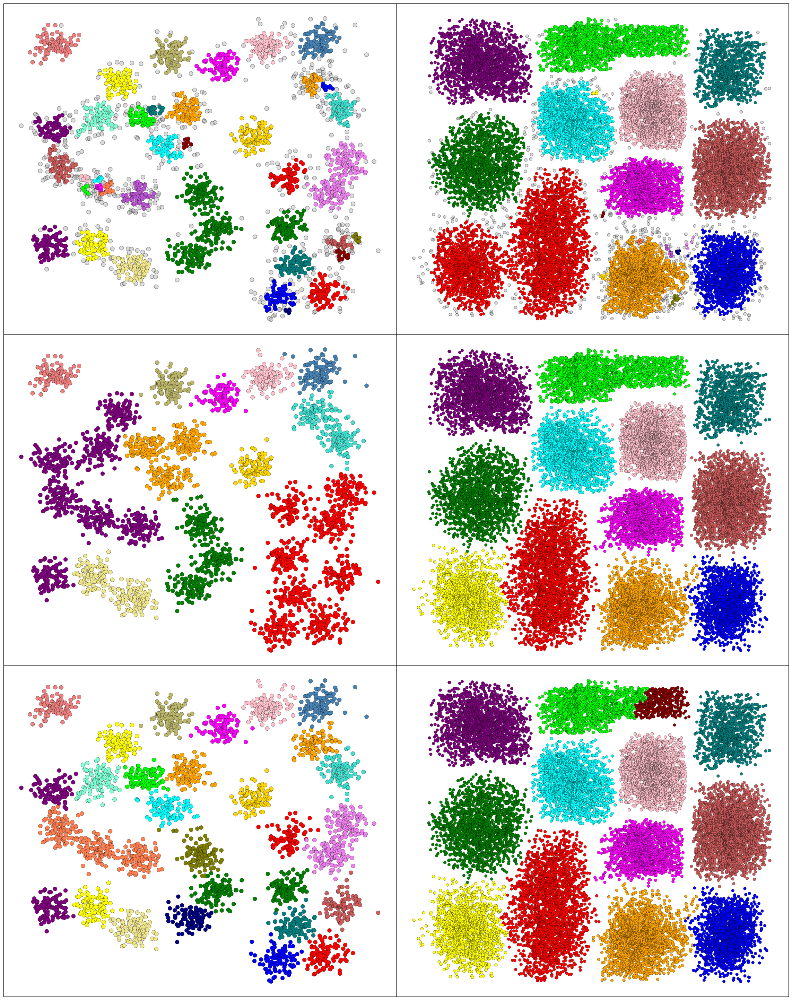

In [11]:
from datasets.example_datasets import Datasets as ExampleDatasets

figure_settings = [
    [
        {
            "dataset": ExampleDatasets.d31,
            "tree_type": "DCTree",
            "power": 0,
            "method": "Stability",
        },
        {
            "dataset": ExampleDatasets.boxes3,
            "tree_type": "DCTree",
            "power": 0,
            "method": "Stability",
        },
    ], [
        {
            "dataset": ExampleDatasets.d31,
            "tree_type": "DCTree",
            "power": 1,
            "method": "MedianOfElbows",
        },
        {
            "dataset": ExampleDatasets.boxes3,
            "tree_type": "DCTree",
            "power": 1,
            "method": "MedianOfElbows",
        },
    ], [
        {
            "dataset": ExampleDatasets.d31,
            "tree_type": "DCTree",
            "power": 2,
            "method": "Elbow",
        },
        {
            "dataset": ExampleDatasets.boxes3,
            "tree_type": "DCTree",
            "power": 2,
            "method": "Elbow",
        },
    ],
]



fontsize = 45
font = {'family': 'sans-serif',
        'size': fontsize}
plt.rc('font', **font)

fig, axes = plt.subplots(len(figure_settings), len(figure_settings[0]), figsize=(24,30))

for i, row_settings in enumerate(figure_settings):
    for j, setting in enumerate(row_settings):
        X, l = load_labeling(**setting)
        axes[i,j].set_xticks([])
        axes[i,j].set_yticks([])
        plot_clustering(axes[i,j], X, l, dot_scale=2 if j == 0 else 1)

# axes[0,0].set_title("d31", fontsize=fontsize)
# axes[0,1].set_title("boxes3", fontsize=fontsize)

# axes[0,0].set_ylabel("$k$-center - stability", fontsize=fontsize)
# axes[1,0].set_ylabel("$k$-median - med of medians", fontsize=fontsize)
# axes[2,0].set_ylabel("$k$-means - elbow", fontsize=fontsize)


#orig: wspace=0.0, hspace=0.05
#kdtree: wspace=-0, hspace=-0.509
#dctree: wspace=-0.74, hspace=0

plt.tight_layout()
plt.subplots_adjust(wspace=0.0, hspace=0.0) #CHANGE SPACING HERE BETWEEN THE CLUSTER PLOTS
plt.savefig("DCFramework_Methods.jpg", bbox_inches='tight', pad_inches=0.05, dpi=70)
plt.show()

In [12]:
def cluster(X, l, clustering_func):
    clustering_labels = clustering_func(X, l)
    reordered_labels = clustering_labels
    reordered_labels[clustering_labels != -1] = reorder_labels(clustering_labels[clustering_labels != -1], l[clustering_labels != -1])

    return X, reordered_labels

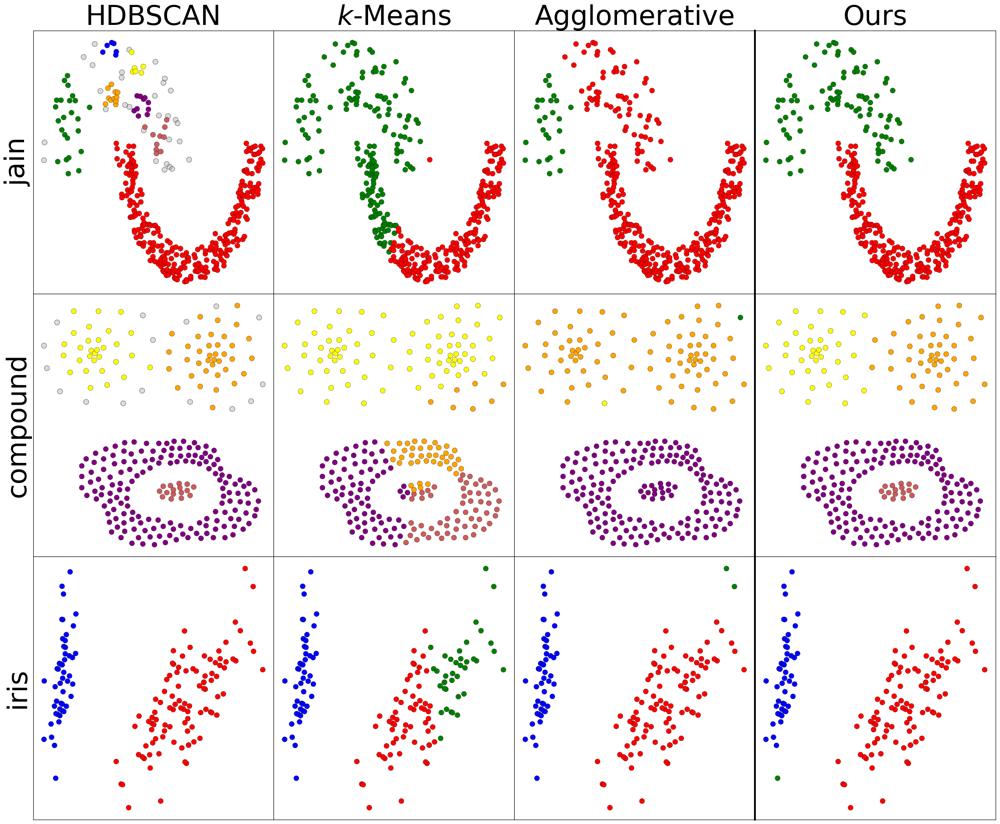

In [13]:
from datasets.example_datasets import Datasets as ExampleDatasets
from datasets.density_datasets import Datasets as DensityDatasets
from sklearn.metrics import adjusted_rand_score as ari
from sklearn.cluster import HDBSCAN, KMeans, AgglomerativeClustering
from sklearn.datasets import load_iris
from SHiP import SHiP


iris = load_iris(as_frame=True)
X_iris = iris["data"].to_numpy()
X_iris__ = np.empty(X_iris.shape)
X_iris__[:, :] = X_iris[:, :]
X_iris = X_iris__
l_iris = iris["target"].to_numpy()


def HDBSCAN_cluster(X, l):
    hdbscan = HDBSCAN()
    return hdbscan.fit_predict(X)

def KMeans_cluster(X, l):
    kmeans = KMeans(len(set(l)))
    return kmeans.fit_predict(X)

def Agglomerative_cluster(X, l):
    aggl = AgglomerativeClustering(len(set(l)), linkage="single")
    return aggl.fit_predict(X)

def SHiP_cluster(X, l):
    ship = SHiP(X, "DCTree")
    return np.array(ship.fit_predict(2, "K", {"k": len(set(l))}))

figure_settings = [
    [
        {
            "X": DensityDatasets.jain.data_cached[0],
            "l": DensityDatasets.jain.data_cached[1],
            "clustering_func": HDBSCAN_cluster,
        },
        {
            "X": DensityDatasets.jain.data_cached[0],
            "l": DensityDatasets.jain.data_cached[1],
            "clustering_func": KMeans_cluster,
        },
        {
            "X": DensityDatasets.jain.data_cached[0],
            "l": DensityDatasets.jain.data_cached[1],
            "clustering_func": Agglomerative_cluster,
        },
        {
            "X": DensityDatasets.jain.data_cached[0],
            "l": DensityDatasets.jain.data_cached[1],
            "clustering_func": SHiP_cluster,
        },
    ], [
        {
            "X": ExampleDatasets.compound_left.data_cached[0],
            "l": ExampleDatasets.compound_left.data_cached[1],
            "clustering_func": HDBSCAN_cluster,
        },
        {
            "X": ExampleDatasets.compound_left.data_cached[0],
            "l": ExampleDatasets.compound_left.data_cached[1],
            "clustering_func": KMeans_cluster,
        },
        {
            "X": ExampleDatasets.compound_left.data_cached[0],
            "l": ExampleDatasets.compound_left.data_cached[1],
            "clustering_func": Agglomerative_cluster,
        },
        {
            "X": ExampleDatasets.compound_left.data_cached[0],
            "l": ExampleDatasets.compound_left.data_cached[1],
            "clustering_func": SHiP_cluster,
        },
    ], [
        {
            "X": X_iris,
            "l": l_iris,
            "clustering_func": HDBSCAN_cluster,
        },
        {
            "X": X_iris,
            "l": l_iris,
            "clustering_func": KMeans_cluster,
        },
        {
            "X": X_iris,
            "l": l_iris,
            "clustering_func": Agglomerative_cluster,
        },
        {
            "X": X_iris,
            "l": l_iris,
            "clustering_func": SHiP_cluster,
        },
    ],
]



fontsize = 45
font = {'family': 'sans-serif',
        'size': fontsize}
plt.rc('font', **font)

fig, axes = plt.subplots(len(figure_settings), len(figure_settings[0]), figsize=(24,20))

for i, row_settings in enumerate(figure_settings):
    for j, setting in enumerate(row_settings):
        X, labels_ = cluster(**setting)
        axes[i,j].set_xticks([])
        axes[i,j].set_yticks([])
        plot_clustering(axes[i,j], X, labels_, dot_scale=2)

axes[0,0].set_title("HDBSCAN", fontsize=fontsize)
axes[0,1].set_title("$k$-Means", fontsize=fontsize)
axes[0,2].set_title("Agglomerative", fontsize=fontsize)
axes[0,3].set_title("Ours", fontsize=fontsize)

axes[0,0].set_ylabel("jain", fontsize=fontsize)
axes[1,0].set_ylabel("compound", fontsize=fontsize)
axes[2,0].set_ylabel("iris", fontsize=fontsize)

for i in range(len(figure_settings)):
    axes[i, -1].spines["left"].set_linewidth(3)

#orig: wspace=0.0, hspace=0.05
#kdtree: wspace=-0, hspace=-0.509
#dctree: wspace=-0.74, hspace=0

plt.tight_layout()
plt.subplots_adjust(wspace=0.0, hspace=0.0) #CHANGE SPACING HERE BETWEEN THE CLUSTER PLOTS
plt.savefig("DCFramework_Multiple_Clusterings.jpg", bbox_inches='tight', pad_inches=0.05, dpi=70)
plt.show()